<a href="https://colab.research.google.com/github/maleal2/Assignment-4.1-Advanced-Vision-Problems/blob/main/ML_Assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- **Name**: Maria Carolina Leal Cardenas.
- **Date**: 11/16/2024.

# **Mounting Google Drive in Colab**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Importing necessary libraries**

In [36]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imutils
import pandas as pd
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

# **Part 1- Feature extraction**

Start with reading the image shared with on BB (pic 1 @thispersondoesnotexist). Read the image using OpenCV and create two versions of it. One colorful and one gray-scaled one. Store the gray scaled image as "pic1_gray.jpg". We need this image down the road.

Hint: by default the image may be loaded as BGR and you have to modify it to make it RGB.

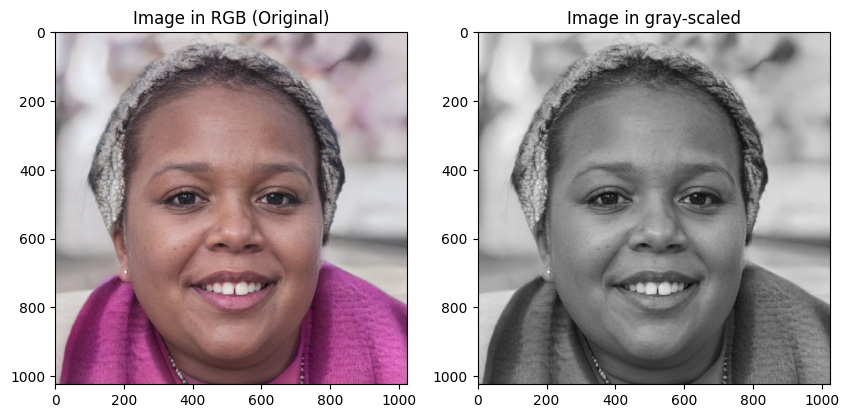

In [4]:
# Read the original image pic1 and create a regular plus a gray version of it.
# The result should be similar to what you see in instrcutions

# Path to the original image.
Image_path = '/content/drive/MyDrive/Colab Notebooks/Assignment4_pic1.jpg'

# Reading the original image.
bgr_image = cv2.imread(Image_path)

# Converting the BGR image to RGB.
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Converting the BGR image to grayscale.
gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)

# Saving the grayscale image.
gray_image_path = '/content/drive/MyDrive/Colab Notebooks/pic1_gray.jpg'
cv2.imwrite(gray_image_path, gray_image)

# Displaying both images (gray and RGB).
f = plt.figure(figsize=(10, 5))
f.add_subplot(1, 2, 1)
plt.imshow(rgb_image)
plt.title('Image in RGB (Original)')
plt.axis('on')

f.add_subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Image in gray-scaled')
plt.axis('on')


plt.show()



a) SIFT: in 2024, David Lowe introduced Scale-Invariant Feature transform as a method for extracting distinctive invariant features from images. The idea was feature matching between images. The biggest advantage of the method is detecting image features irrespective of orientation and size. For this part, please provide the SIFT using OpenCV on colorful image.
Ceate two outputs one with sizing and one without it.

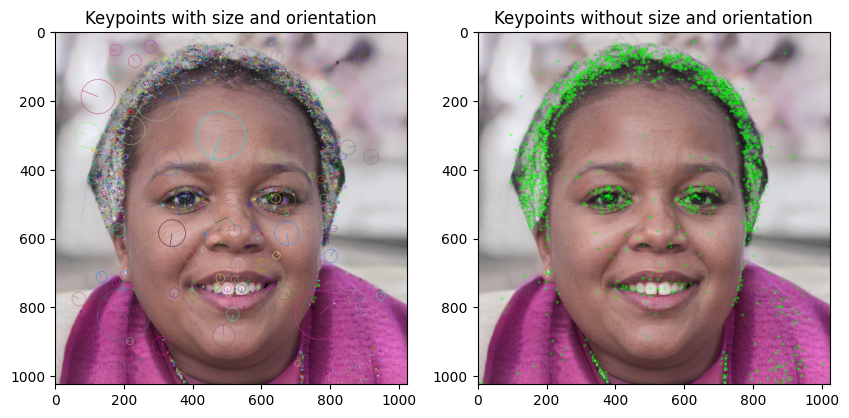

In [5]:
#a- SIFT

# Initializing the SIFT detector.
# sift = cv2.xfeatures2d.SIFT_create() # Deprecated module. OpenCV modev the SIFT implementation to the main cv2 module starting from OpenCV 4.4.0. Which makes unecessary to rely on xfeatures2d.
sift= cv2.SIFT_create()

# Detecting keypoints and compute descriptors.
original_keypoints, original_descriptor = sift.detectAndCompute( gray_image, None)

# Copying the RGB image to draw keypoints without size.
keypoints_without_size = np.copy(rgb_image)

# Drawing the keypoints with rich information ( including size and orientation)
result1 = cv2.drawKeypoints(rgb_image, original_keypoints, None ,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Drawing the keypoints without including size and orientation.
result2 = cv2.drawKeypoints(rgb_image, original_keypoints,keypoints_without_size, color = (0, 255, 0))

# Plotting the results
f = plt.figure(figsize=(10, 5))
f.add_subplot(1, 2, 1)
plt.imshow(result1)
plt.title('Keypoints with size and orientation')
plt.axis('on')

f.add_subplot(1, 2, 2)
plt.imshow(result2)
plt.title('Keypoints without size and orientation')
plt.axis('on')

plt.show()

## Explain your understanding here

Firstly, we need to understand the importance of a "keypoint". They are distinctive points in an image that are identified by feature detection. They represent locations in the image that are rich in information and invariant to certain transformations, such as scaling, rotation, and illumination. They are typically located in regions with significant variation in intensity, such as: corners, edges or blobs.

Secondly, we have descriptors, which are numerical  vectors that describe the local appearance around each keypoint. They encode the visual information, such as: patterns, intensity changes; around the keypoint in a way that is invariant to scale, rotation, and lighting.

In the first picture: "Keypoints with size and orientation". The circles represent the detected keypoints, where the size of each circle corresponds to the scale of the keypoint.

The orientation, which is indicated by the line within the circle; shows the direction the descriptor is invariant to, which is crucial for scale and rotation-invariant feature matching.

As for the second picture: "Keypoints without size and orientation". The keypoints are simply marked as dots (green), showing their positions without additional information about size or orientation.

In conclusion, the picture with rich keypoints are better for robust applications like object recognition or matching real-world scenarios because they handle scale and rotation changes effectivel. In contrast with second picture (raw keypoints), are much simpler but less versatile. They might suffice in controlled environments where objects have a consistent orientation and size.

b) FAST: in 2006, Edward Rosten and Tom Drummond proposed "Features from accelerated segment test" (FAST) which is a corner detection method to extract feature points. This is especially popular in real-time video processing. OpenCV allows you to create this without suppression.

Create two outputs: one with max suppression and one without it.

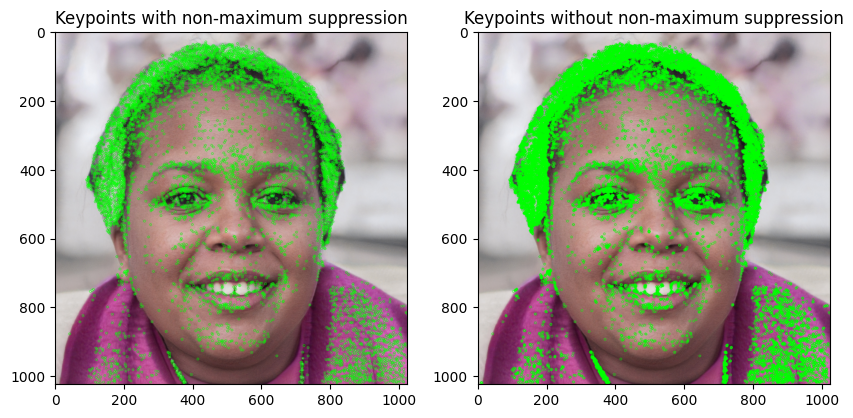

In [6]:
# b- FAST

# Initializing the Fast detector.
fast = cv2.FastFeatureDetector_create()

# Detecting keypoints without non-maximum suppresion.
fast.setNonmaxSuppression(False)
keypoints_without_nonmax = fast.detect(rgb_image, None)

# Drawing the keypoints without non-maximum suppression.
image_without_nonmax = np.copy(rgb_image)
result_without_nomax = cv2.drawKeypoints(image_without_nonmax, keypoints_without_nonmax, None, color = (0, 255, 0))

# Detecting keypoints with non-maximum suppresion.
fast.setNonmaxSuppression(True)
keypoints_with_nonmax = fast.detect(rgb_image, None)

# Drawing the keypoints with non-maximum suppression.
image_with_nonmax = np.copy(rgb_image)
result_with_nomax = cv2.drawKeypoints(image_with_nonmax, keypoints_with_nonmax, None, color = (0, 255, 0))

# Display the results.
f = plt.figure(figsize=(10, 5))
f.add_subplot(1, 2, 2)
plt.imshow(result_without_nomax)
plt.title('Keypoints without non-maximum suppression')
plt.axis('on')

f.add_subplot(1, 2, 1)
plt.imshow(result_with_nomax)
plt.title('Keypoints with non-maximum suppression')
plt.axis('on')

plt.show()


## Explain your understanding here:

1. **Keypoints with Non-Maximum Suppression (Left Image)**:

**Observations:**

- The detected keypoints are fewer and more spread out.

- Only the most distinctive or "strongest" corners are retained, avoiding redundancy.

- The detection is cleaner and focuses on significant areas of the image.

**Analysis **:

- Non-Maximum Suppression filters out weaker, redundant keypoints that are too close to stronger ones.

- This is especially useful in real-world applications to reduce computational overhead and focus on meaningful features.

- The retained keypoints are better suited for tasks like tracking, matching, or recognition.

2. **Keypoints without Non-Maximum Suppression (Right Image):**

**Observations:**

- A much larger number of keypoints are detected, including several overlapping ones.

- Many redundant keypoints appear in areas where non-maximum suppression would have eliminated them (e.g., around edges or textured regions).

**Analysis:**

- Without Non-Maximum Suppression, all potential corners are marked, including weaker and redundant ones.

- This increases computational cost and might introduce noise, reducing accuracy in downstream tasks (like matching or tracking). However, in specific applications (e.g., where redundancy is acceptable), this could be useful for dense feature representation.


c ) ORB: Oriented FAST and Rotated BRIEF (ORB) was originally proposed by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011 (OpenCV Labs). The biggest advantage of this method is its robustness to distortion and noise.

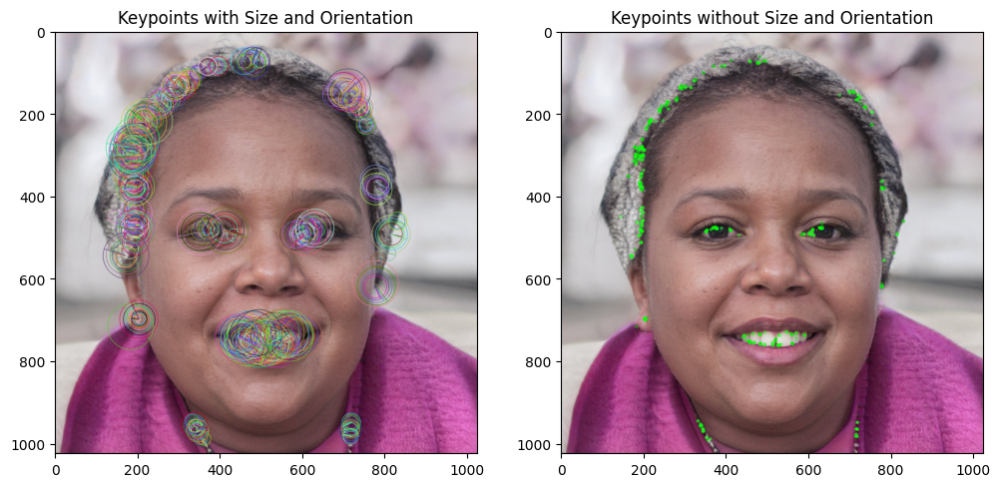

In [7]:
# c- ORB

# Initializing the ORB detector.
orb = cv2.ORB_create()

# Detecting keypoints and compute descriptors.
keypoints, descriptors = orb.detectAndCompute(rgb_image, None)

# Copying the RGB image to create two visualizations
keypoints_with_size = np.copy(rgb_image)
keypoints_without_size = np.copy(rgb_image)

# Drawing keypoints with size (including orientation and scale)
result_with_size = cv2.drawKeypoints(
    keypoints_with_size,
    keypoints,
    None,
    None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
)

# Drawing keypoints without size (just the locations)
result_without_size = cv2.drawKeypoints(
    keypoints_without_size,
    keypoints,
    None,
    color=(0, 255, 0),
    flags=0,
)

# Displaying the results
f = plt.figure(figsize=(12, 6))
f.add_subplot(1, 2, 1)
plt.imshow(result_with_size)
plt.title('Keypoints with Size and Orientation')
plt.axis('on')

f.add_subplot(1, 2, 2)
plt.imshow(result_without_size)
plt.title('Keypoints without Size and Orientation')
plt.axis('on')

plt.show()

## Explain your understanding here:

**Keypoints with Size and Orientation (Left Image):**

**Observations:**

- The detected keypoints are represented as circles, where the size corresponds to the scale of detection.

- The orientation of each keypoint is indicated by the line inside the circle, representing the dominant gradient direction.

- Keypoints are located on distinctive features like the eyes, lips, and textured areas such as the fabric and hair.

**Analysis**:

ORB detects and represents keypoints with scale and rotation invariance.
This is critical for tasks where objects in the image might be rotated or scaled, such as object recognition, tracking, or matching across different images.

The keypoints shown here provide a detailed and rich representation of the image, making them robust for real-world applications.

**Keypoints without Size and Orientation (Right Image):**

**Observations**:

- Keypoints are shown as green dots, marking their locations without additional information about scale or orientation.

- The detected keypoints are fewer and only mark distinctive areas of the image.

**Analys**:

- This visualization focuses solely on the location of the keypoints, ignoring their size and rotation.

- It is less robust for tasks requiring invariance to scaling and rotation.

- Useful for simpler tasks, such as counting keypoints or identifying the approximate position of features.

**Comparison**:

**Scale and Rotation Invariance**:

- The left image includes information about the scale and orientation, making it more suitable for applications where images might be transformed.

- The right image lacks this information, making it less versatile.

**Keypoint Density**:

- Both images detect keypoints in prominent areas (e.g., eyes, mouth), but the left image provides additional information for more robust and detailed feature representation.

**Applications**:

- With Size and Orientation: Ideal for object detection, image matching, and scenarios where images are subject to transformations.

- Without Size and Orientation: Useful for simple tasks like detecting and marking features in static, untransformed images.


 In conclusion, the left image demonstrates the full power of ORB, capturing both the location and detailed properties (size, orientation) of keypoints, making it robust against transformations.

The right image provides a simpler representation, suitable for lightweight tasks.

The results clearly show the importance of additional keypoint attributes (size and orientation) for complex computer vision applications.

d) One of the aspects of using feature extraction in OpenCV is to find feature matching between two images. Use this ability to make comparisons between the colorful and gray image. Print the number of matching points.

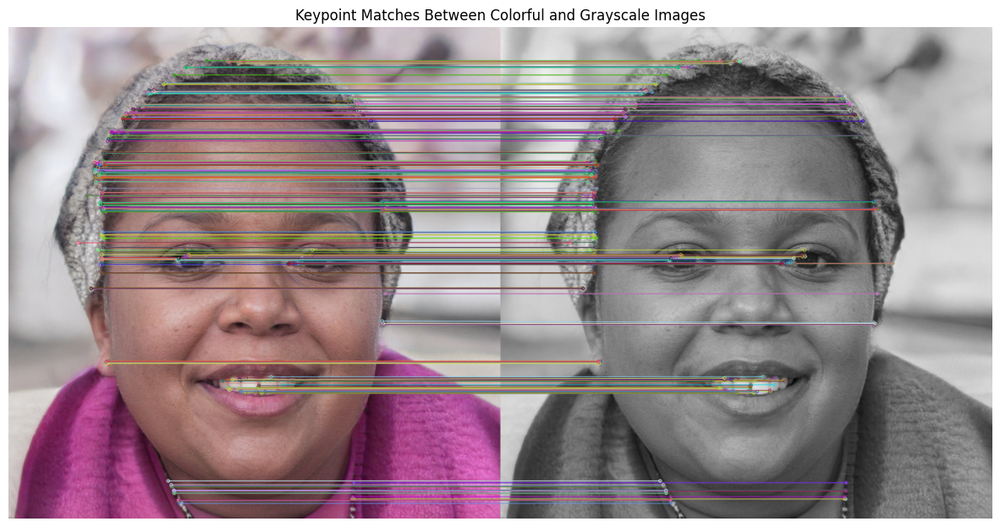

The number of matching keypoints between the original and the grayscale image is: 445


In [13]:
#d- Finding the matching points

# Detecting and compute descriptors for gray image.
keypoints_gray, descriptors_gray = orb.detectAndCompute(gray_image, None)

# Using Brute-Force Matcher with Hamming distance
brute_force = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Matching descriptors
matches = brute_force.match(descriptors, descriptors_gray)

# Sorting matches by distance (best matches first).
matches = sorted(matches, key=lambda x: x.distance)

# Drawing matches on the images
result = cv2.drawMatches(
    rgb_image, keypoints, gray_image, keypoints_gray, matches, None, flags=2
)

# Displaying the result
plt.figure(figsize=(15, 10))
plt.imshow(result)
plt.title('Keypoint Matches Between Colorful and Grayscale Images')
plt.axis('off')
plt.show()

# Printing the number of matching points
print("The number of matching keypoints between the original and the grayscale image is: {}".format(len(matches)))

## Explain your understanding here. What is the goal of this matching point?

- The purpose of finding matching keypoints between two images (colorful and grayscale in this case) is to evaluate the consistency and robustness of feature detection and description methods.

By matching keypoints, we can:

1. Verify whether the descriptors (computed from the keypoints) remain invariant under changes in image format, such as color to grayscale.

2. Determine the ability of the algorithm (ORB in this example) to establish a reliable correspondence between the two images, ensuring that key features are consistently identified.

From the above result, it can be detected:

1. Robust distribution:ORB is robust in detecting and describing keypoints, even when the image format changes from colorful to grayscale.

2. Uniform distribution: Keypoints are distributed across the image, including facial features, clothing, and background, indicating that the algorithm is not biased toward any specific region.

In conclusion, the result of 445 matching points shows that the ORB algorithm can effectively detect and match features despite the color to gray scale transformation, making it suitable for applications requiring feature consistency under varying conditions.

# **Part 2- Face recognition**

For this part, we want  to see how computer vision can help with face recognition (face detection).

Start with downloading the image of Assignment_pic2.jpg  file (©unsplash.com- a free resource of    images). We need to start with Haar  feature detection concept and use Haar cascading  procedure. You can get  more information about haar  cascading  here. Download the required  .xml files from assignment package.

Note:  Using cv2.imshow  is  a  tool  for  showing images  in  Python.  However,  this  command  makes
crashes  in Google c  olab.  Instead use  cv2_imshow. You need to call  the  package using:  from google.colab.patches import cv2_imshow

a) Apply  the face and eye detection algorithm on the provided image.

b) Connect your own webcam and see how accurately  this can detect you in the image. To  make

it more challenging, you can bring in other people, animals, objects,.. in screen.

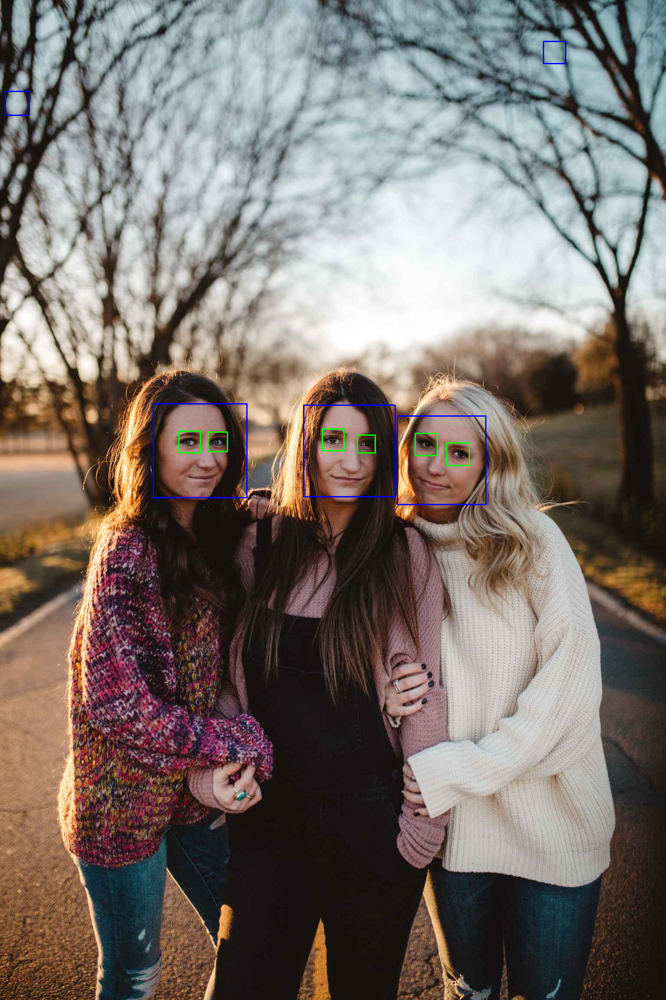

In [9]:
# Importing required modules
from google.colab.patches import cv2_imshow

# Loading Haar cascades
face_cascade = cv2.CascadeClassifier("/content/drive/MyDrive/Colab Notebooks/haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier("/content/drive/MyDrive/Colab Notebooks/haarcascade_eye.xml")

# Reading and converting the image to grayscale
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/Assignment4_pic2.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detecting faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

# Detecting eyes within each face
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# Displaying the result
cv2_imshow(img)

In [10]:
#b- Working on webcam
#Function to activate your laptop cam. This function is comp;ete and you don't need to do anything.
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

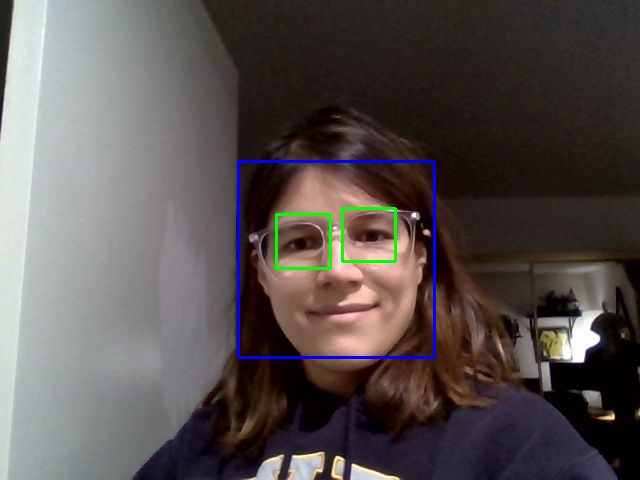

In [15]:
# Calling the webcam function
image_file = take_photo(filename='photo.jpg')

# Reading the captured image
image = cv2.imread(image_file)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Appling face and eye detection
faces = face_cascade.detectMultiScale(gray, 1.3, 5)
for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)
    roi_gray = gray[y:y + h, x:x + w]
    roi_color = image[y:y + h, x:x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)

# Displaying the result
from google.colab.patches import cv2_imshow
cv2_imshow(image)



# **Part 3- Parameter detection**

For  the last  part of the assignment, create a model that can count  the number of apples in the
image provided in Canvas  (‘apple.jpg’). For  more information about the procedure,  reference
your  Practical Machine Learning  for  Computer  Vision  (Lakshmanan, 2021)  textbook. Your
model should print  the proper number of apples on the  image.

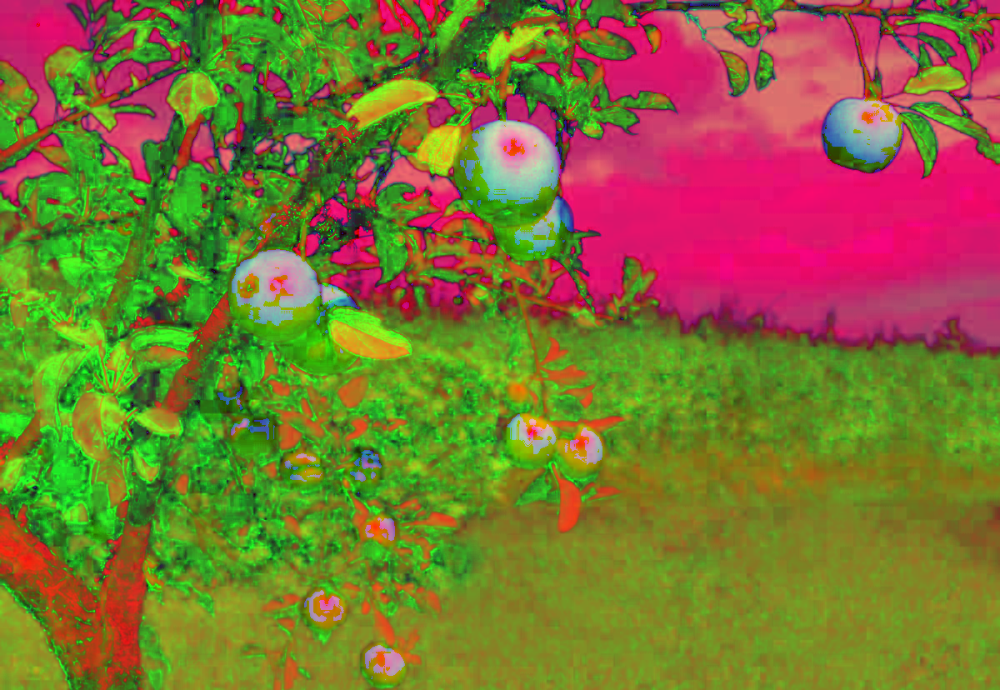

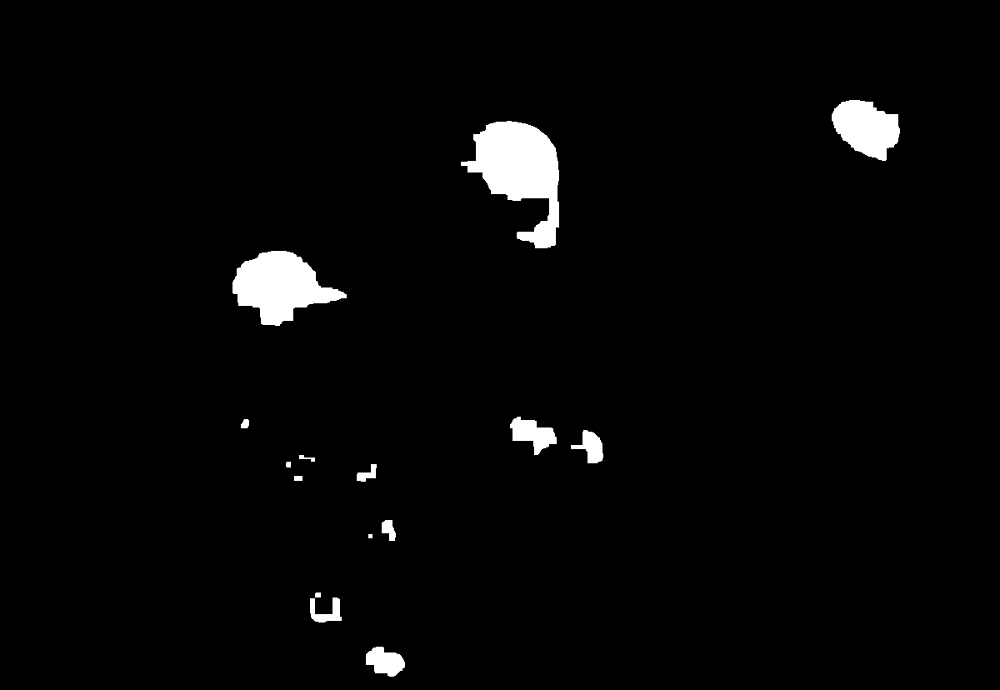

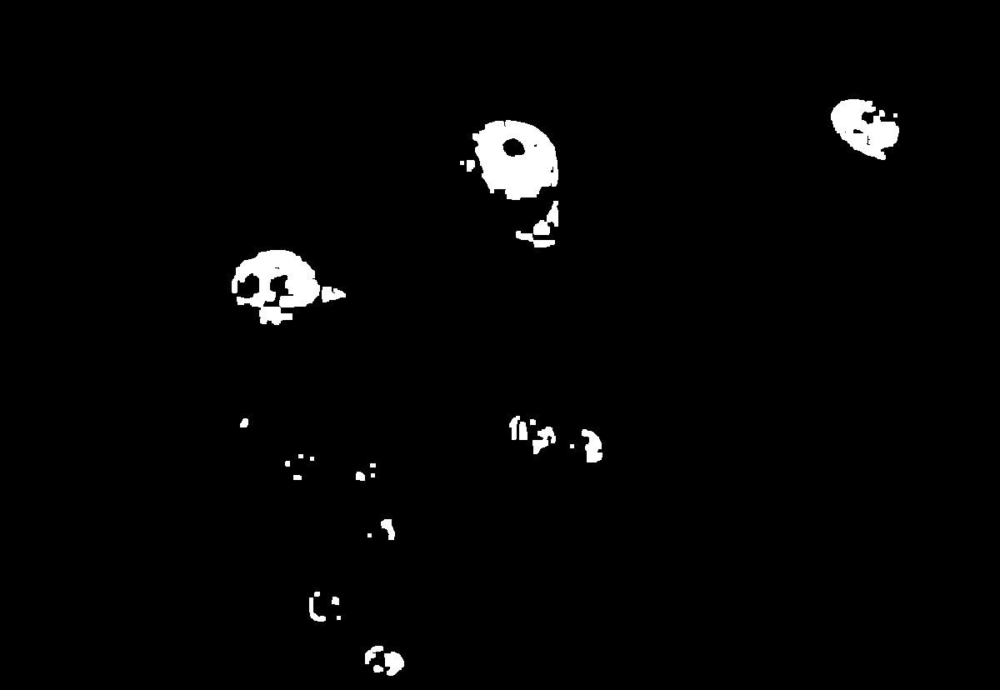

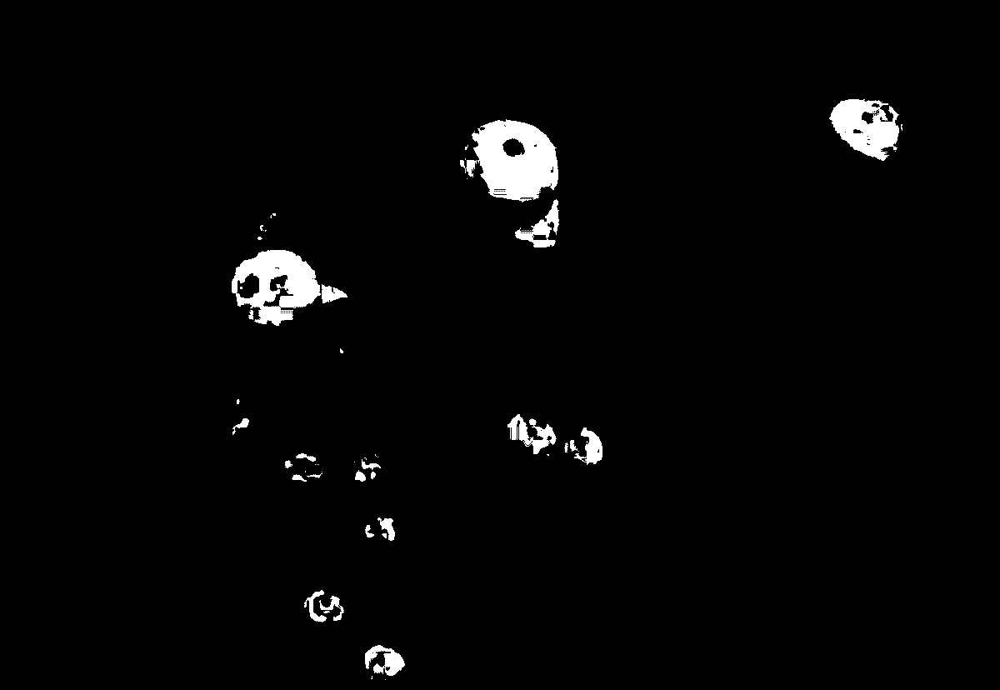

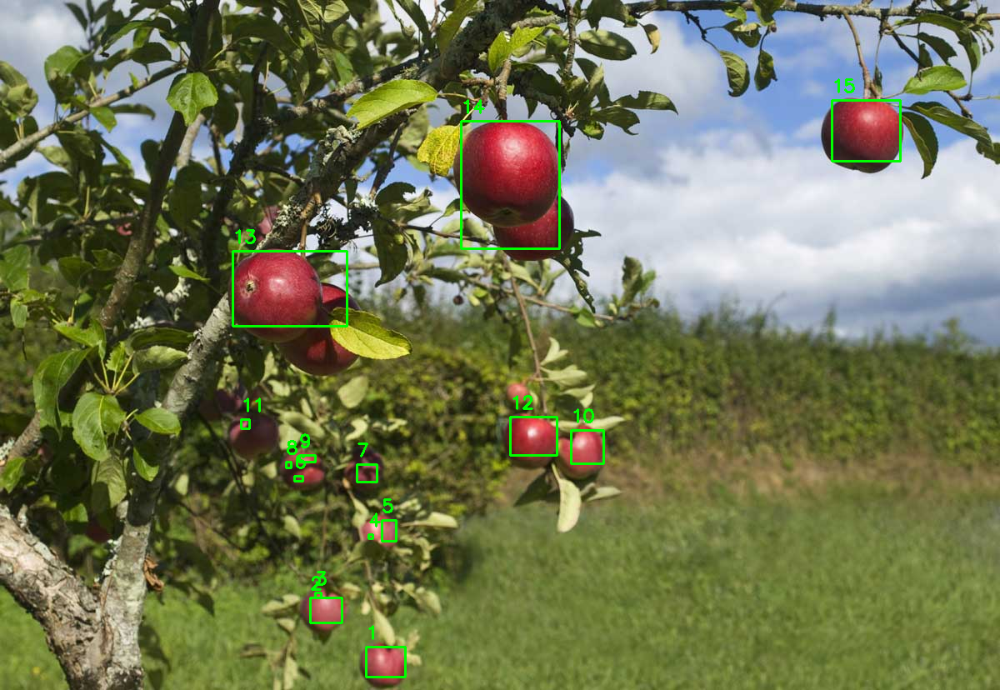

There were 15 apples in this picture.


In [20]:
# Coloring thresholds for detecting apples in HSV space
lowerBound = np.array([170, 100, 80])
upperBound = np.array([180, 256, 256])

# Morphological kernels
kernelOpen = np.ones((5, 5))
kernelClose = np.ones((20, 20))

# Loading image
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/apple.jpg')

# Converting BGR to HSV
imgHSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Displaying HSV image (debugging step)
cv2_imshow(imgHSV)

# Creating mask
mask = cv2.inRange(imgHSV, lowerBound, upperBound)

# Applying morphological operations
maskOpen = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernelOpen)
maskClose = cv2.morphologyEx(maskOpen, cv2.MORPH_CLOSE, kernelClose)

# Final mask for contour detection
maskFinal = maskClose

# Finding contours
conts, _ = cv2.findContours(maskFinal.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

# Drawing contours and bounding boxes
for i, c in enumerate(conts):
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(img, str(i + 1), (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

# Displaying results
cv2_imshow(maskClose)
cv2_imshow(maskOpen)
cv2_imshow(mask)
cv2_imshow(img)

# Printing apple count
print(f'There were {len(conts)} apples in this picture.')




image 1/1 /content/drive/MyDrive/Colab Notebooks/apple.jpg: 448x640 16 apples, 10.8ms
Speed: 2.4ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict19


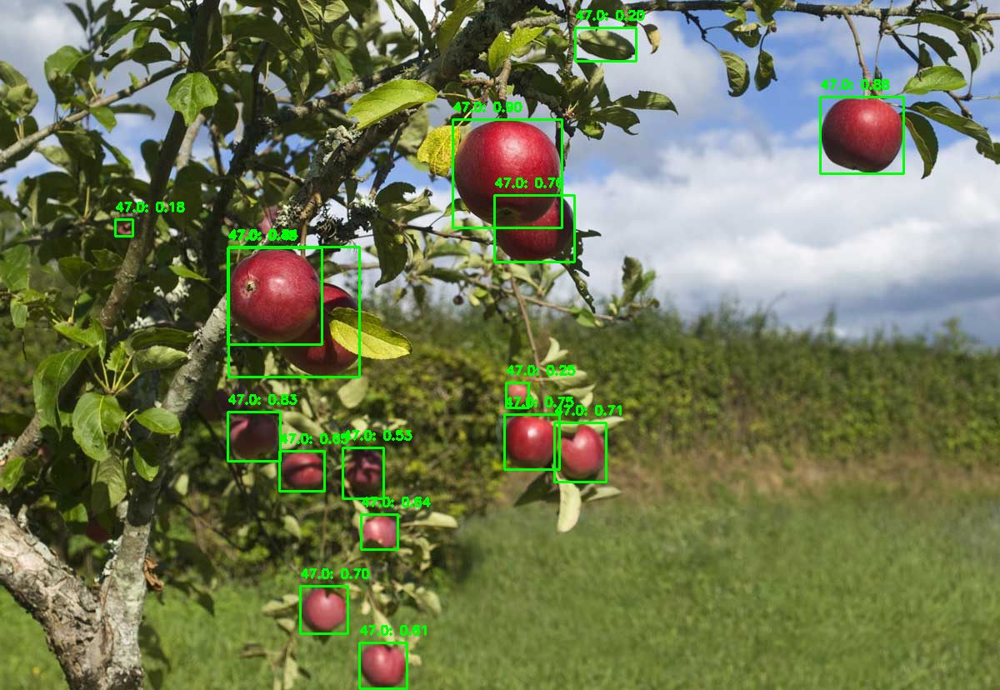

Number of apples detected: 16


In [46]:
# Installing YOLOv8
!pip install ultralytics

from ultralytics import YOLO

# Loading the YOLOv8 model
model = YOLO('yolov8m.pt')  # Using YOLOv8m for a larger model.

# Loadin the image
image_path = '/content/drive/MyDrive/Colab Notebooks/apple.jpg'
img = cv2.imread(image_path)

# Performing inference
results = model.predict(source=image_path, conf=0.175, iou= 0.6, save=True)

# Displaying detected objects
for result in results:
    boxes = result.boxes.xyxy
    confidences = result.boxes.conf  # Confidence scores
    classes = result.boxes.cls  # Class IDs

    # Drawing bounding boxes on the image
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = map(int, box)
        confidence = confidences[i]
        class_id = classes[i]

        # Only consider 'apple' class
        if class_id == "apple" or confidence > 0.175:
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, f"{class_id}: {confidence:.2f}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Displaying the final image with detections
cv2_imshow(img)

# Printing the number of apples detected
apple_count = len(results[0].boxes)
print(f"Number of apples detected: {apple_count}")


# Analysis and Observations

**First Model**: Color Thresholding with Morphological Operations
Overview:

- This approach uses specific HSV color thresholds to isolate red-colored objects in the image. Morphological operations (opening and closing) help refine the mask by reducing noise and filling gaps.
Contours are extracted, and bounding boxes are drawn around detected objects.
Strengths:

- Customizability: It provides precise control over color ranges for the target objects (apples in this case).

- Fast Processing: It performs well for simpler use cases where objects are clearly distinguishable by color.

- Simple and lightweight: Does not require pre-trained weights or complex neural networks.

**Weaknesses**:

- Misclassification: Cannot distinguish between apples and other objects with similar colors.

- Limited to Color: If apples are partially occluded or shadows distort their color, this method may fail.

- Bounding Overlap: Some detections are merged into one, leading to undercounting (e.g., when apples are close together).

- Hardcoded Thresholds: Requires manual adjustment of thresholds for different lighting or conditions.

**Results**:

- Detected 15 apples.
- A few apples in shadow or partially occluded regions were missed.
- Some bounding boxes overlapped with multiple apples.

**Second Model**: YOLOv8

**Overview**:

YOLO (You Only Look Once) is a state-of-the-art object detection model that uses deep learning to classify and localize objects in one pass.

- In this case, YOLOv8 was used with a confidence threshold of 0.175 and an IoU (Intersection over Union) threshold of 0.6 to improve precision and minimize overlapping detections.

**Strengths**:

- Robust Object Detection: Accurately detects objects even under varied lighting, occlusion, or distortion.

- Generalization: Pre-trained weights enable YOLO to detect objects across different contexts without needing custom thresholds.

- IoU and Confidence Control: Fine-tuning these parameters helps balance false positives and missed detections.

- Individual Detection: Each apple is treated as a separate object with high confidence, minimizing overlap.

**Weaknesses**:

- False Positives: YOLO detected non-apples (e.g., a  leaf) as apples.

- Computationally Intensive: Requires more resources for inference compared to simpler approaches like color thresholding.

- Training Dependency: Performance depends on the quality of the training dataset.

**Results**:

- Detected 16 apples.
- While YOLO avoided overlapping bounding boxes, it falsely identified some non-apples due to the low confidence threshold (0.175).
- Increasing the IoU threshold reduced redundant detections, but some genuine apples were still missed.